In [2]:
import time
import pandas as pd
import seaborn as sns
import numpy as np
import xgboost as xgb
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import r2_score, mean_absolute_error, accuracy_score
import matplotlib.style as style

# Import Solar Data

In [3]:
# Read in solar data
df = pd.read_csv('solar.csv')

# Inspect Solar Data

In [4]:
# Set it so notebook displays all rows and columns
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [5]:
df.head()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,wind_20_25,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
0,17.482477,1.170917,0.105995,0.633266,2.283365,1.693559,44.453082,364.535502,259.336758,84.727511,1.533447,6.800320,53.518950,289.967694,226.767352,0.289757,59.088734,89.730545,0.912183,0.125753,980.235616,1.440811,170.697945,2.004954,6.808065,0.255123,0.066430,0.010053,9.407523,5.883980,52.639734,398.525435,334.819130,222.820824,2.444363,4.919266,75.917671,377.680199,315.113150,0.028059,23.614613,39.040662,0.024744,0.006393,4.544550,0.677448,97.974019,1.259040,0.975799,0.024201,0.000000,0.0,0.0,0.000000,0.117009,0.519749,0.309132,0.054110,0.000000,11.345953,0.385478
1,10.638014,1.234575,0.203333,0.605332,4.252774,4.318661,56.101826,304.948059,225.833562,150.866781,3.496005,6.813356,66.765183,181.034247,168.845662,0.313260,82.629508,89.652166,0.933839,0.166274,1010.912100,2.034053,216.804224,0.277226,9.420571,0.221865,0.165429,0.016038,12.061130,9.506297,72.441287,350.645771,298.095864,266.812136,2.846087,8.980317,97.584138,295.437367,253.748425,0.036557,17.003641,35.474678,0.028205,0.218258,8.278902,1.327307,97.915669,0.281286,1.000000,0.000000,0.000000,0.0,0.0,0.098174,0.368950,0.318836,0.207877,0.006164,0.000000,0.085942,0.296734
2,17.279258,1.087721,0.089535,0.625356,1.355683,2.075417,43.025000,376.086530,260.699201,55.903082,1.740297,-1.310411,52.581507,321.172945,239.316096,0.297009,36.310227,89.721392,0.917850,0.217479,908.053425,1.232340,166.867123,2.708368,10.463042,0.253744,0.052993,0.008564,7.471838,7.782102,50.971430,410.127028,337.038585,160.403278,2.871132,7.041038,75.628831,390.400905,322.296787,0.030322,21.903826,38.326372,0.023874,0.020156,7.154181,0.836624,88.544889,1.830125,0.863699,0.135616,0.000685,0.0,0.0,0.009817,0.274201,0.305251,0.265639,0.138927,0.006164,29.339176,0.206103
3,16.199224,1.119745,0.082997,0.626558,1.295320,1.865694,41.401370,382.939155,262.341210,57.561416,1.734932,-1.931176,51.860616,326.311187,240.679909,0.295665,35.223853,89.725954,0.918850,0.208932,889.050228,1.132363,168.069521,2.716267,10.383212,0.269069,0.051492,0.008153,7.264456,7.120833,49.037981,416.422452,338.860411,164.672911,2.824075,7.231931,76.367969,396.253312,323.681484,0.029692,21.778615,38.326474,0.023068,0.009606,4.852951,0.788957,88.897770,1.846981,0.862100,0.137215,0.000685,0.0,0.0,0.016096,0.302055,0.298973,0.258447,0.122489,0.001941,29.399852,0.213841
4,22.222374,1.013168,0.153029,0.636547,2.685704,2.916724,54.431164,328.002511,264.479224,103.356621,2.302740,17.926142,75.002055,229.511644,219.042009,0.279202,81.118175,89.734632,0.953959,0.148466,1010.840183,3.400434,162.807192,2.220457,5.771296,0.291801,0.069745,0.013575,9.843649,8.083429,63.247521,367.592124,338.721462,241.704961,2.862271,6.007028,110.613416,327.211633,300.904255,0.019829,18.198721,42.296128,0.018481,0.008031,4.324406,1.395487,105.688248,1.311094,0.963584,0.036416,0.000000,0.0,0.0,0.000000,0.029909,0.261872,0.626941,0.081279,0.000000,14.670770,0.219861


In [7]:
df.tail()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,wind_20_25,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
2584,14.300799,1.367526,0.174933,0.602321,3.611100,3.544715,53.818379,328.007534,246.939726,114.872374,2.830365,9.554795,71.286301,209.988470,193.477397,0.300481,77.128874,89.718196,0.938697,0.137973,977.809361,2.262603,181.753881,0.992089,9.818678,0.198988,0.149309,0.010101,11.526768,8.466361,68.706870,370.498177,320.208436,232.794770,3.063482,8.884377,108.146449,320.754232,278.657866,0.031003,21.084595,38.498533,0.026382,0.041562,6.749443,1.306153,105.495881,0.564067,1.000000,0.000000,0.000000,0.0,0.0,0.056164,0.288356,0.306393,0.295548,0.053539,0.0,1.291309,0.210245
2585,15.649087,1.292308,0.185415,0.604978,3.499432,3.047709,56.970205,317.223858,245.586301,117.252283,2.765525,11.307991,72.438014,209.256963,195.470434,0.299948,79.983451,89.681546,0.945114,0.154767,1006.018265,2.554132,172.852169,1.805160,9.221818,0.247012,0.136934,0.010983,11.895690,7.611192,71.727113,360.043010,318.565049,240.372335,3.041539,8.548085,107.122539,315.674039,279.498723,0.027453,19.501845,38.689868,0.024126,0.054785,7.046139,1.383914,106.416325,1.030694,0.989498,0.010502,0.000000,0.0,0.0,0.034703,0.241895,0.335731,0.333447,0.054224,0.0,7.755143,0.185472
2586,15.649087,1.292308,0.185415,0.604978,3.499432,3.047709,56.970205,317.223858,245.586301,117.252283,2.765525,11.307991,72.438014,209.256963,195.470434,0.299948,79.983451,89.681546,0.945114,0.154767,1006.018265,2.554132,172.852169,1.805160,9.221818,0.247012,0.136934,0.010983,11.895690,7.611192,71.727113,360.043010,318.565049,240.372335,3.041539,8.548085,107.122539,315.674039,279.498723,0.027453,19.501845,38.689868,0.024126,0.054785,7.046139,1.383914,106.416325,1.030694,0.989498,0.010502,0.000000,0.0,0.0,0.034703,0.241895,0.335731,0.333447,0.054224,0.0,7.755143,0.216650
2587,15.655936,1.303321,0.180961,0.604978,3.426137,3.381426,56.323059,317.804224,245.350114,115.370548,2.956963,11.476027,72.706735,207.286187,194.826598,0.297724,80.775844,89.705176,0.944525,0.155151,1005.805936,2.634749,170.774543,1.844064,9.381361,0.255480,0.127624,0.010983,11.698713,8.324069,70.341298,360.328563,318.322681,233.645676,3.115889,8.682167,107.233179,314.426076,279.078672,0.025921,19.242222,38.688647,0.024110,0.039418,7.277209,1.498622,105.076214,1.031867,0.989954,0.010046,0.000000,0.0,0.0,0.034703,0.246233,0.330936,0.318950,0.069178,0.0,8.005752,0.213145
2588,6.821347,1.217062,0.139723,0.604429,4.566362,4.855281,48.923059,327.121461,223.363584,145.779795,3.253311,2.581963,64.632534,187.416553,164.840639,0.318886,75.664921,89.682421,0.935700,0.369068,969.811644,1.600126,204.632192,3.368801,11.736147,0.197462,0.097955,0.006854,12.353182,10.959995,60.249339,368.187802,296.679561,249.398958,2.901128,11.376261,96.790720,304.125637,248.739301,0.033730,17.612818,33.917861,0.025967,0.299701,8.036654,1.098335,101.085222,1.840939,0.810160,0.186872,0.002968,0.0,0.0,0.284703,0.280137,0.265525,0.164612,0.005023,0.0,47.106706,0.156963


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2589 entries, 0 to 2588
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   avg_air_temperature           2589 non-null   float64
 1   avg_alpha                     2589 non-null   float64
 2   avg_aod                       2589 non-null   float64
 3   avg_asymmetry                 2589 non-null   float64
 4   avg_cld_opd_dcomp             2589 non-null   float64
 5   avg_cld_reff_dcomp            2589 non-null   float64
 6   avg_clearsky_dhi              2589 non-null   float64
 7   avg_clearsky_dni              2589 non-null   float64
 8   avg_clearsky_ghi              2589 non-null   float64
 9   avg_cloud_press_acha          2589 non-null   float64
 10  avg_cloud_type                2589 non-null   float64
 11  avg_dew_point                 2589 non-null   float64
 12  avg_dhi                       2589 non-null   float64
 13  avg

In [9]:
df.describe()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,wind_20_25,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
count,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2.589000e+03,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000
mean,13.382682,1.225866,0.150701,0.613348,3.373733,3.590116,50.658777,334.375348,241.902564,114.280783,2.753528,6.375700,64.224291,226.683697,195.062800,0.306336,71.475593,89.701652,0.933497,0.216791,976.619590,1.932747,200.266145,1.891156,9.783584,0.243736,0.112503,0.011256,10.902161,8.975947,62.812589,374.387412,315.790014,229.066342,2.925163,8.232967,94.357526,329.278022,279.891176,0.032982,20.170058,37.126466,0.024902,0.132548,6.903138,1.148848,97.813591,1.105947,0.943196,0.055802,0.000990,0.000012,6.613862e-07,0.096008,0.269334,0.320667,0.255583,0.055022,0.003386,16.642337,0.205680
std,4.374231,0.101923,0.039726,0.013549,1.212974,0.931011,5.839743,24.762959,14.459018,29.788546,0.656875,4.394217,7.183002,49.018191,27.480868,0.013028,14.627128,0.022883,0.011436,0.072558,48.269305,0.507779,22.299801,1.076119,1.447307,0.028382,0.041042,0.003047,2.242834,1.268900,9.140634,20.732596,15.588969,29.410728,0.187644,2.048459,11.822473,33.686121,27.745641,0.006195,3.703599,2.056004,0.002942,0.116987,1.370008,0.294186,8.944227,0.559048,0.082912,0.080010,0.004779,0.000140,2.507943e-05,0.095544,0.079844,0.067516,0.097797,0.052155,0.011406,21.426987,0.047009
min,3.959817,0.507320,0.064033,0.598162,0.736386,1.303974,35.448402,293.563014,215.821804,40.524429,1.041438,-5.296689,46.601826,155.626142,147.595091,0.271173,32.319694,89.626065,0.908273,0.046137,735.889155,0.842489,86.175000,0.045445,1.525439,0.176403,0.035865,0.004564,4.770795,4.958740,40.973062,341.363770,289.958074,144.974481,2.073478,1.553039,64.573493,269.812548,233.107372,0.015488,6.341198,32.274030,0.017022,0.004831,2.473601,0.432686,57.215317,0.132117,0.320434,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.061872,0.000000,0.000000,0.011206,0.068104
25%,9.665194,1.167629,0.107915,0.603539,2.508057,3.032308,45.149772,317.353539,227.975571,94.284589,2.288014,3.054281,57.525913,190.884247,170.091210,0.296457,61.648316,89.685432,0.924334,0.157260,973.680365,1.596495,186.349543,1.018151,9.235334,0.222625,0.067996,0.009169,9.573862,8.325194,53.240504,360.061107,300.687978,214.326821,2.877143,7.110037,86.943052,304.958143,254.432707,0.028280,17.781513,35.276349,0.022836,0.016697,5.831397,0.915090,95.302052,0.597265,0.919064,0.000000,0.000000,0.000000,0.000000e+00,0.010046,0.240982,0.285502,0.181279,0.009589,0.000000,1.372548,0.171689
50%,14.0403

# Correlations

In [5]:
#Show correlations
df.corr()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,wind_20_25,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
avg_air_temperature,1.000000,-0.442035,-0.273997,0.527405,-0.797172,-0.785478,-0.095574,0.354523,0.832068,-0.705636,-0.796138,0.386106,-0.138437,0.627288,0.801907,-0.866011,-0.480092,0.598168,-0.152679,-0.658448,0.130931,0.313165,-0.329653,0.150023,-0.590729,0.410583,-0.440583,-0.234323,-0.760682,-0.473224,-0.217942,0.340325,0.817560,-0.471629,-0.407087,-0.666130,-0.261718,0.566682,0.790376,-0.812520,0.462879,0.916608,-0.393229,-0.906291,-0.754743,-0.034364,0.053557,0.142892,0.076331,-0.070294,-0.147078,-0.017389,0.030844,-0.911646,-0.734589,0.337833,0.756658,0.828997,0.500722,-0.060033,0.538799
avg_alpha,-0.442035,1.000000,0.650111,-0.824240,0.564667,0.476998,0.565186,-0.547451,-0.439062,0.460637,0.586487,0.204367,0.552530,-0.590012,-0.554791,0.285627,0.543271,-0.316735,0.490514,-0.020519,0.120277,0.316614,-0.050913,-0.323556,0.416939,-0.340915,0.651551,0.091655,0.581764,0.225547,0.603502,-0.534166,-0.470343,0.345296,0.615455,0.639963,0.588925,-0.564496,-0.555680,0.203218,-0.277718,-0.273573,0.419359,0.266544,0.504900,0.575313,0.313227,-0.331914,0.299521,-0.306988,-0.055503,-0.038020,-0.044669,0.328391,0.440252,-0.229972,-0.236759,-0.426316,-0.492031,-0.273014,-0.401737
avg_aod,-0.273997,0.650111,1.000000,-0.769498,0.656130,0.474106,0.975777,-0.951744,-0.574345,0.686708,0.625271,0.606287,0.841471,-0.828048,-0.702789,0.336981,0.814747,-0.273983,0.724718,-0.202208,0.648359,0.685601,-0.179825,-0.264523,0.080063,-0.319700,0.942156,0.414082,0.593173,0.088556,0.988415,-0.942764,-0.619690,0.703058,0.492380,0.604586,0.783860,-0.865321,-0.718451,0.257324,-0.664414,-0.201122,0.317643,0.191900,0.651653,0.848304,0.292895,-0.355073,0.164038,-0.170180,0.001875,0.045526,0.001294,0.214802,0.232512,-0.271760,0.092051,-0.497425,-0.333091,-0.129237,-0.585831
avg_asymmetry,0.527405,-0.824240,-0.769498,1.000000,-0.715107,-0.626327,-0.709450,0.704170,0.578022,-0.625533,-0.726742,-0.185374,-0.658122,0.736065,0.701302,-0.449042,-0.603840,0.360130,-0.596444,-0.158094,-0.223713,-0.360022,0.088486,0.237411,-0.514562,0.453727,-0.780234,-0.317765,-0.682056,-0.363067,-0.755000,0.683265,0.613601,-0.478604,-0.611463,-0.879696,-0.686107,0.728814,0.717558,-0.338505,0.629942,0.379019,-0.461424,-0.447240,-0.722492,-0.764891,-0.310132,0.263848,-0.106533,0.112739,-0.039096,-0.009101,0.026471,-0.509245,-0.423609,0.463199,0.220340,0.500424,0.311843,0.101480,0.531219
avg_cld_opd_dcomp,-0.797172,0.564667,0.656130,-0.715107,1.000000,0.842313,0.535197,-0.735044,-0.857511,0.932093,0.921341,0.133928,0.594648,-0.933114,-0.966184,0.736106,0.806980,-0.543609,0.596982,0.372295,0.272281,0.226416,0.034691,-0.227365,0.357653,-0.431742,0.711621,0.344818,0.963283,0.390367,0.603580,-0.724241,-0.871699,0.794800,0.538697,0.744731,0.662805,-0.895337,-0.956016,0.650913,-0.742934,-0.701365,0.292051,0.728168,0.827642,0.479997,0.052916,-0.277773,-0.022576,0.015774,0.126275,0.045608,-0.001882,0.748725,0.523603,-0.401808,-0.370853,-0.844440,-0.517709,0.020833,-0.723849
avg_cld_reff_dcomp,-0.785478,0.476998,0.474106,-0.626327,0.842313,1.000000,0.349423,-0.554929,-0.785808,0.823326,0.944705,-0.032629,0

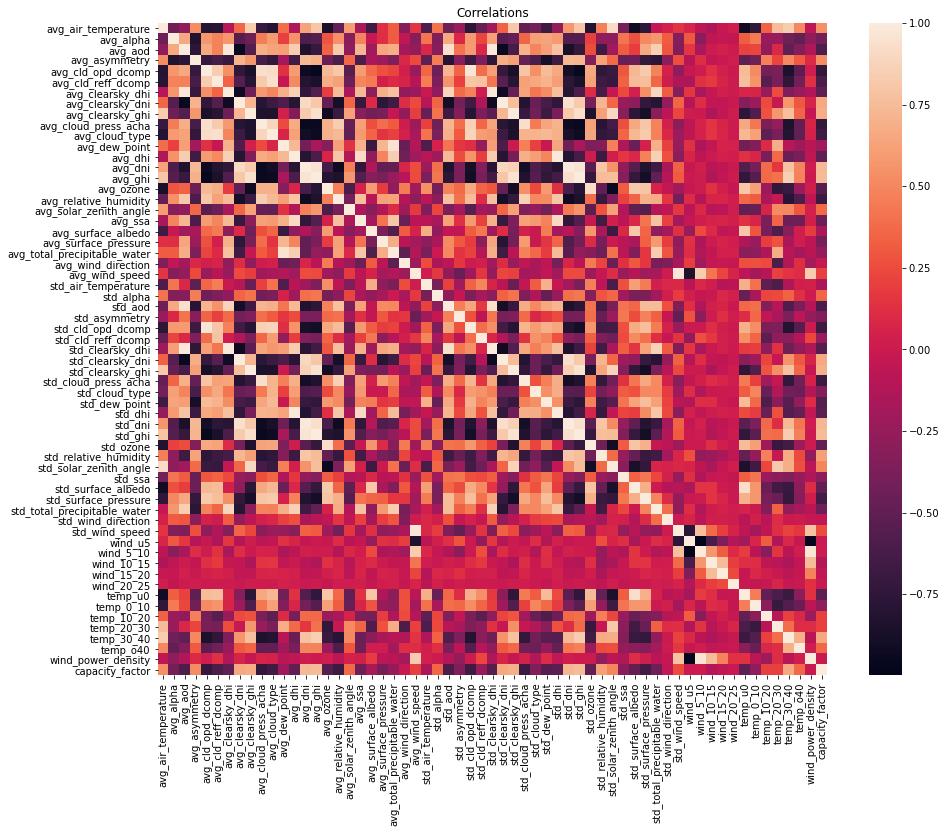

In [6]:
# Create heatmap
plt.figure(figsize=(15,12))
sns.heatmap(df.corr()).set_title('Correlations')
plt.show()

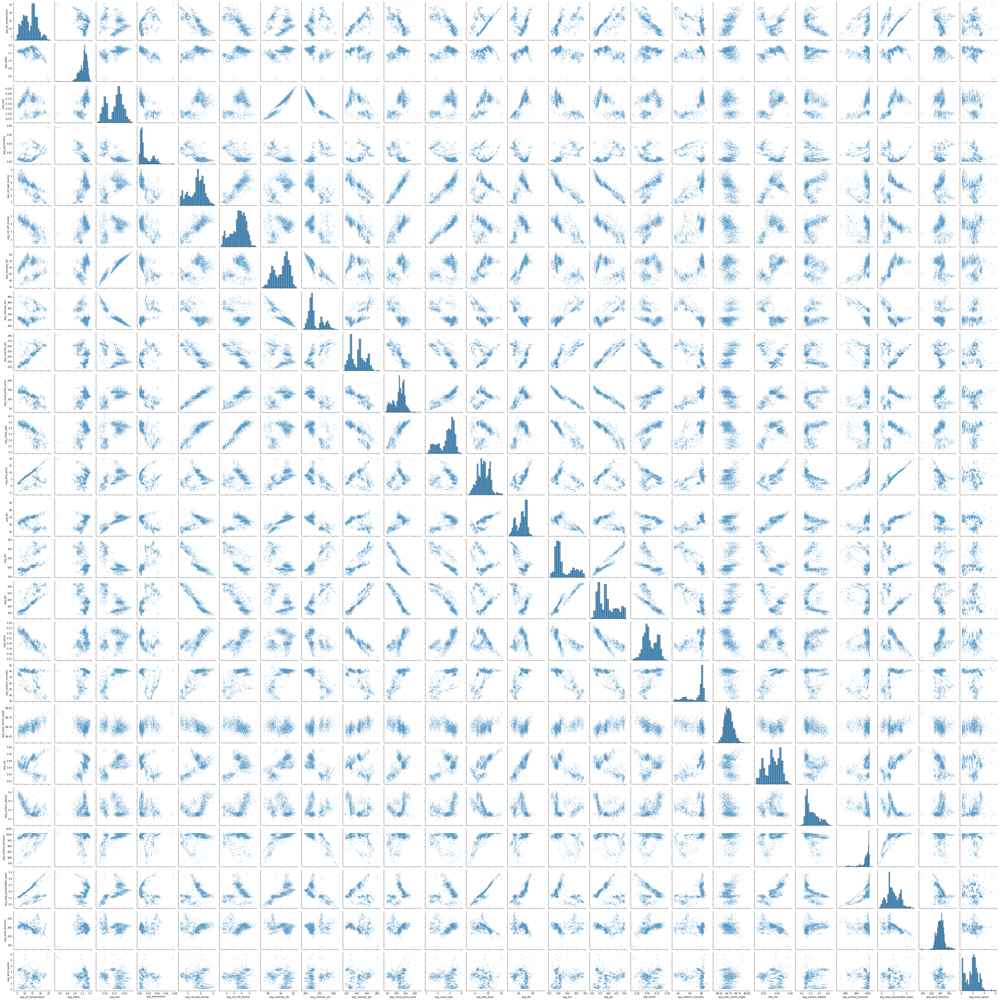

In [7]:
# Create pairplot of average values
avg_features = ['avg_air_temperature', 'avg_alpha', 'avg_aod', 'avg_asymmetry', 'avg_cld_opd_dcomp',
                  'avg_cld_reff_dcomp', 'avg_clearsky_dhi',	'avg_clearsky_dni', 'avg_clearsky_ghi',
                  'avg_cloud_press_acha', 'avg_cloud_type', 'avg_dew_point', 'avg_dhi', 'avg_dni', 'avg_ghi',
                  'avg_ozone', 'avg_relative_humidity', 'avg_solar_zenith_angle', 'avg_ssa', 'avg_surface_albedo',
                  'avg_surface_pressure', 'avg_total_precipitable_water', 'avg_wind_direction', 'avg_wind_speed']

sns.pairplot(df[avg_features], plot_kws={"s": 2})
plt.show()

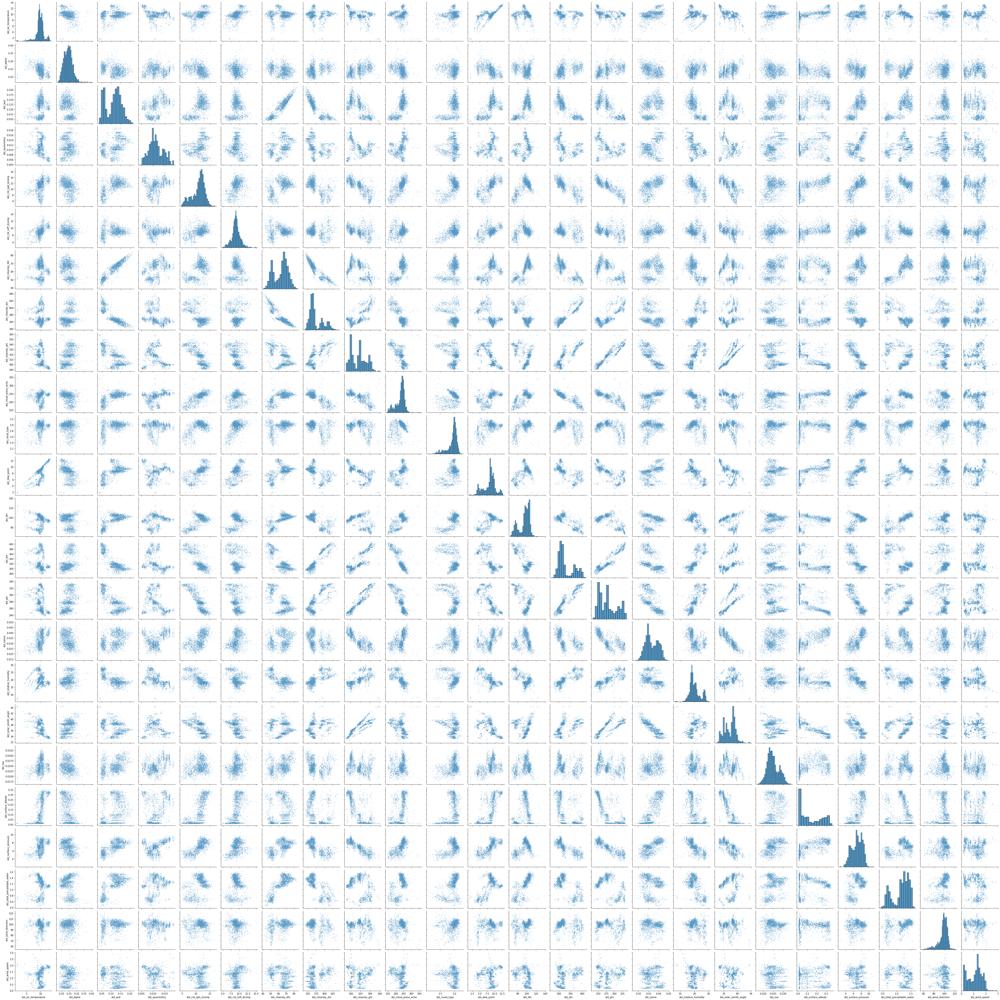

In [9]:
# Create pairplot of SD values
std_features = ['std_air_temperature', 'std_alpha', 'std_aod', 'std_asymmetry', 'std_cld_opd_dcomp',
                'std_cld_reff_dcomp', 'std_clearsky_dhi', 'std_clearsky_dni', 'std_clearsky_ghi',
                'std_cloud_press_acha', 'std_cloud_type', 'std_dew_point', 'std_dhi', 'std_dni', 'std_ghi',
                'std_ozone', 'std_relative_humidity', 'std_solar_zenith_angle', 'std_ssa', 'std_surface_albedo',
                'std_surface_pressure', 'std_total_precipitable_water', 'std_wind_direction', 'std_wind_speed']

sns.pairplot(df[std_features], plot_kws={"s": 2})
plt.show()

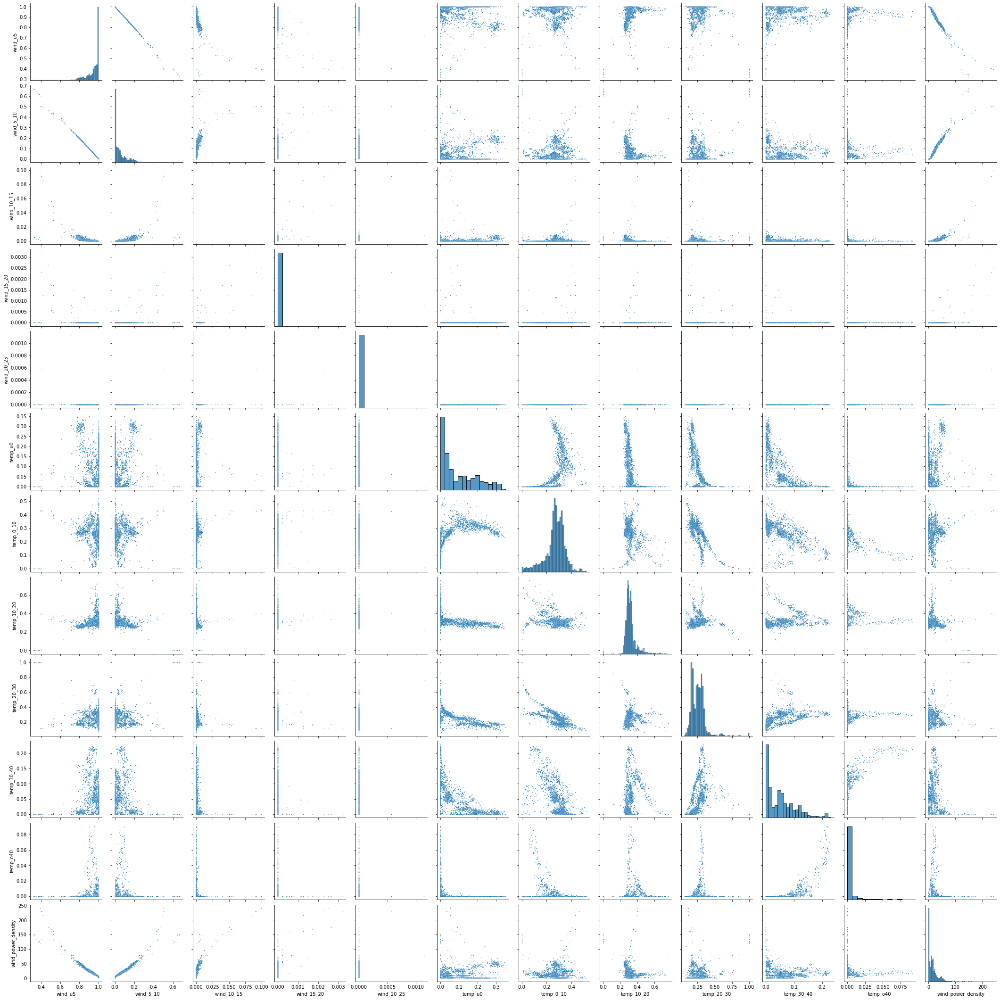

In [7]:
# Create pairplot of newly engineered features
new_features = ['wind_u5', 'wind_5_10', 'wind_10_15', 'wind_15_20', 'wind_20_25', 'temp_u0',
                'temp_0_10', 'temp_10_20', 'temp_20_30', 'temp_30_40', 'temp_o40', 'wind_power_density']

sns.pairplot(df[new_features], plot_kws={"s": 2})
plt.show()

# Create Testing and Training Splits

In [10]:
# Split data for training
X = df.drop('capacity_factor', axis=1)
y = df['capacity_factor'].squeeze()

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, shuffle=True, random_state=1234)

# Create and Train XGBoost Model

In [ ]:
# Grid search was used for tuning hyperparameters
# Not using now that the best best values are known
"""
# Define the XGBoost classifier 
xgb1 = xgb.XGBRegressor(random_state=0, 
                        objective='reg:pseudohubererror', 
                        importance_type='total_gain') 
                        #tree_method='gpu_hist', 
                        #gpu_id=0)

# Define the parameter grid
parameter_grid = {#'predictor': ['gpu_predictor'],
                  'learning_rate': [0.003],
                  'max_depth': [6],
                  #'min_child_weight': [1, 2, 3],
                  #'max_delta_step': [2],
                  'subsample': [0.5],
                  #'colsample_bytree': [0.5, 0.6],
                  'n_estimators': [1500]}

# Define the cross-validation splitting strategy
kfold = KFold(n_splits=10, shuffle=True, random_state=7)

# Define the 
xgb_grid = GridSearchCV(estimator=xgb1,
                        param_grid=parameter_grid,
                        scoring='neg_mean_squared_error',
                        cv=kfold,
                        n_jobs = -1,
                        verbose=2)
"""

In [11]:
# Define the XGBoost model for solar
xgb_solar = xgb.XGBRegressor(learning_rate=0.003,
                             objective='reg:pseudohubererror',
                             max_depth=6, 
                             n_estimators=10000,
                             random_state=0, 
                             n_jobs=-1)

In [12]:
# Keep track of how long the training takes to run
start = time.time()

# Fit the regressor
model = xgb_solar.fit(X_train, y_train)
#model = xgb_grid.fit(X_train, y_train)

# Print the total training time
end = time.time()
total = end - start
print(f'Training time: {total}')

Training time: 28.704739809036255


# Evaluate the Results

In [12]:
# Get predictions for the test set 
y_pred = model.predict(X_test)

# Calculate R-squared and Mean Absolute Error (MAE)
print(f'R2: {r2_score(y_test, y_pred):.5f}')
print(f'MAE: {mean_absolute_error(y_test, y_pred):.5f}')

R2: 0.58478
MAE: 0.02199


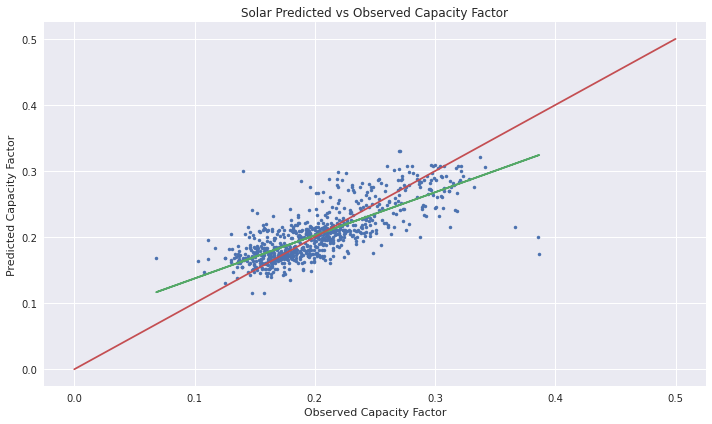

In [13]:
# Plot predictions vs. actual

# Set chart style
style.use('seaborn')
sns.set_style(style='darkgrid')

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10,6))

# Add data to plot
ax.plot(y_test, y_pred,'.')

# Add regression line
m, b = np.polyfit(y_test, y_pred, 1)
ax.plot(y_test, m*y_test+b)

# Add line of identity
ax.plot([0,0.5],[0,0.5])

# Add title and labels
ax.set_title('Solar Predicted vs Observed Capacity Factor')
ax.set_xlabel('Observed Capacity Factor')
ax.set_ylabel('Predicted Capacity Factor')
plt.tight_layout()

In [ ]:
# Not used now that grid search is done

# Print best score and best parameters
"""
print(f'Best score: {xgb_grid.best_score_:.4f}')
print('Best parameters:')
for key, value in xgb_grid.best_params_.items():
    print(f'{key}: {value}')
"""

In [13]:
# Get feature_importances
# importances = list(xgb_grid.best_estimator_.feature_importances_)
importances = list(xgb_solar.feature_importances_)
feature_importances = [(feature, round(importance, 5)) for feature, importance in zip(df.drop('capacity_factor', axis=1).columns, importances)]

# Sort feature_importances
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print feature_importances
for key, value in feature_importances:
    print(f'{key}: {value:.4f}') 

std_ghi: 0.2990
avg_relative_humidity: 0.1345
std_cloud_press_acha: 0.0984
temp_30_40: 0.0604
avg_dni: 0.0448
avg_ghi: 0.0317
avg_cld_opd_dcomp: 0.0279
std_dni: 0.0151
avg_surface_albedo: 0.0133
avg_dhi: 0.0132
std_solar_zenith_angle: 0.0126
std_clearsky_dni: 0.0100
temp_o40: 0.0095
avg_clearsky_dni: 0.0074
temp_20_30: 0.0072
wind_10_15: 0.0070
std_clearsky_ghi: 0.0067
avg_air_temperature: 0.0065
std_cld_opd_dcomp: 0.0063
std_dew_point: 0.0063
avg_surface_pressure: 0.0062
wind_u5: 0.0061
wind_5_10: 0.0060
std_dhi: 0.0059
std_asymmetry: 0.0055
avg_total_precipitable_water: 0.0054
avg_cld_reff_dcomp: 0.0054
avg_wind_direction: 0.0054
std_surface_albedo: 0.0053
std_total_precipitable_water: 0.0053
std_wind_speed: 0.0053
avg_ssa: 0.0052
std_alpha: 0.0051
avg_clearsky_dhi: 0.0050
std_cloud_type: 0.0049
std_surface_pressure: 0.0049
temp_u0: 0.0049
avg_aod: 0.0049
std_wind_direction: 0.0048
avg_wind_speed: 0.0047
avg_ozone: 0.0047
wind_power_density: 0.0047
avg_dew_point: 0.0046
std_aod: 0.00

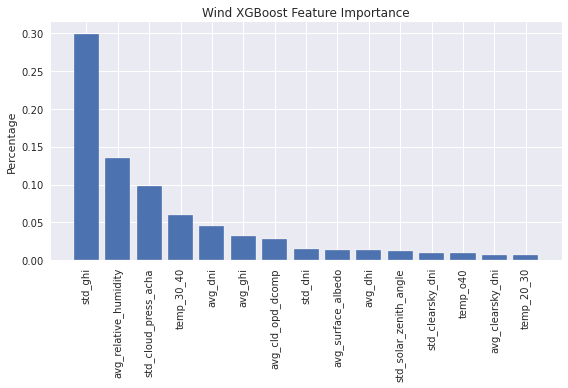

In [15]:
# Plot the most important features

# Set the top number of features to plot
num_features_to_plot = 15

# Create a figure and a set of subplots
fig, ax = plt.subplots()

# Extract feature names and values from feature_importances
features, values = zip(*feature_importances[:num_features_to_plot])

# Add data to plot
ax.bar(features, values)

# Add title and labels
ax.set_title('Wind XGBoost Feature Importance')
ax.set_ylabel('Percentage')
ax.set_xticklabels(features, rotation=90)
plt.tight_layout()